## Face Recognition System

## import dependencies

In [1]:
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import Normalizer
from random import choice
from sklearn.svm import SVC
# pip install mtcnn
from mtcnn.mtcnn import MTCNN 
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

from os import listdir
from os.path import isdir

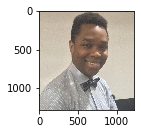

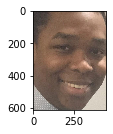

In [3]:
# image = Image.open('me.jpeg')
# # convert to RGB, if needed
# image = image.convert('RGB')
# # convert to array
# pixels = np.asarray(image)
# # create the detector, using default weights
# detector = MTCNN()
# # detect faces in the image
# results = detector.detect_faces(pixels)
# # extract the bounding box from the first face
# x1, y1, width, height = results[0]['box']
# # bug fix
# x1, y1 = abs(x1), abs(y1)
# x2, y2 = x1 + width, y1 + height
# # extract the face
# face = pixels[y1:y2, x1:x2]
# plt.subplot(2,1,1)
# plt.imshow(pixels);plt.show()
# plt.subplot(2,1,2)
# plt.imshow(face);plt.show()

## block 1: detecting faces

In [9]:
# extract a single face from a given photograph
def extract_face(filename, required_size=(160, 160)):
    # load image from file
    image = Image.open(filename)
    # convert to RGB, if needed
    image = image.convert('RGB')
    # convert to array
    pixels = np.asarray(image)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    
#     plt.subplot(1,2,1)
#     plt.title("Original")
#     plt.imshow(pixels);plt.show()

    # extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    # bug fix
    x1, y1 = abs(x1), abs(y1)
    x2, y2 = x1 + width, y1 + height
    # extract the face
    face = pixels[y1:y2, x1:x2]
    
#     plt.subplot(1,2,2)
#     plt.title("Cutted")
#     plt.imshow(face);plt.show()
    
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = np.asarray(image)
    return face_array

In [5]:
# load images and extract faces for all images in a directory
def load_faces(directory):
    faces = list()
    # enumerate files
    for filename in listdir(directory):
        # path
        path = directory + filename
        # get face
        face = extract_face(path)
        # store
        faces.append(face)
    return faces

In [6]:
# load a dataset that contains one subdir for each class that in turn contains images
def load_dataset(directory):
    X, y = list(), list()
    # enumerate folders, on per class
    for subdir in listdir(directory):
        # path
        path = directory + subdir + '/'
        # skip any files that might be in the dir
        if not isdir(path):
            continue
        # load all faces in the subdirectory
        faces = load_faces(path)
        # create labels
        labels = [subdir for _ in range(len(faces))]
        # summarize progress
        print('>loaded %d examples for class: %s' % (len(faces), subdir))
        # store
        X.extend(faces)
        y.extend(labels)
    return np.asarray(X), np.asarray(y)

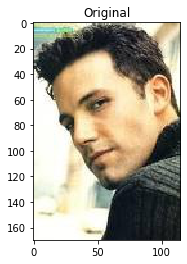

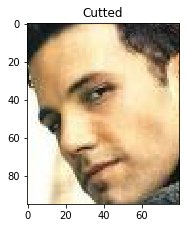

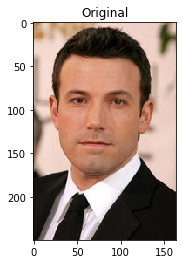

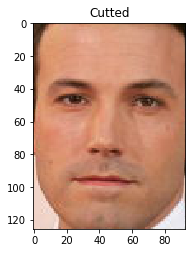

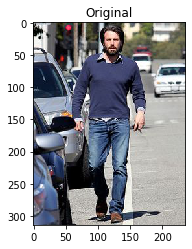

...

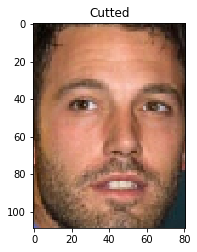

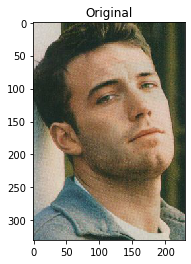

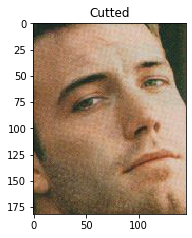

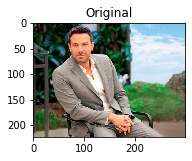

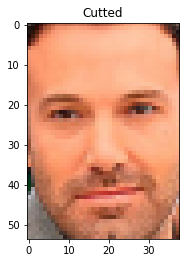

>loaded 14 examples for class: ben_afflek


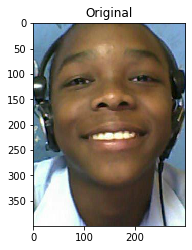

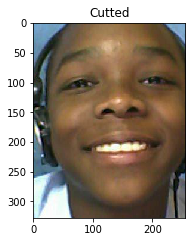

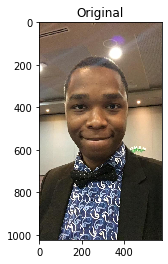

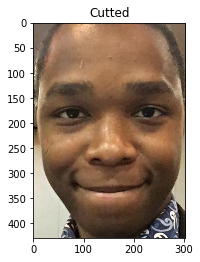

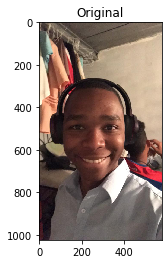

...

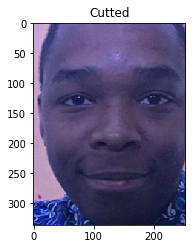

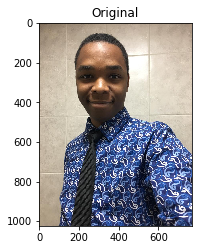

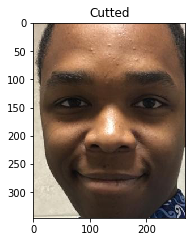

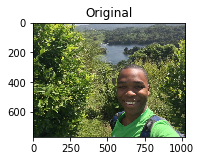

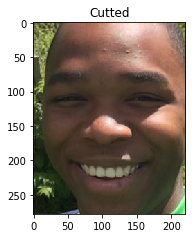

>loaded 22 examples for class: daniel_diaz


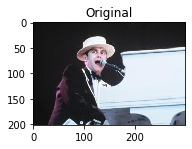

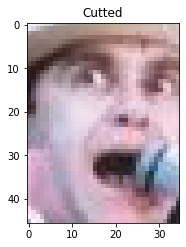

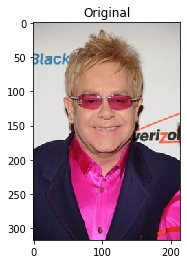

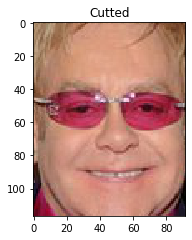

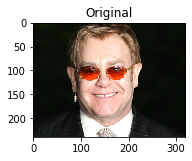

...

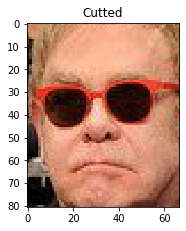

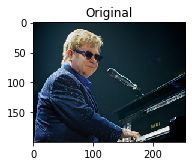

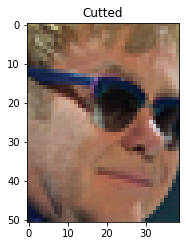

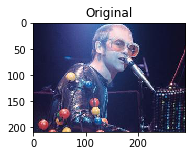

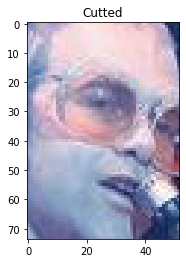

>loaded 17 examples for class: elton_john


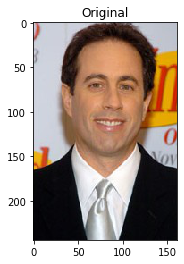

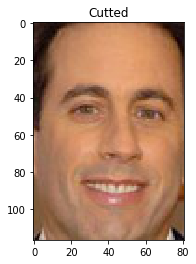

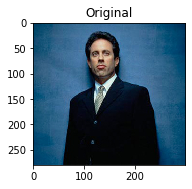

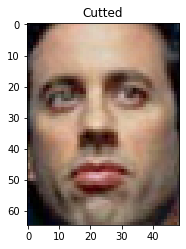

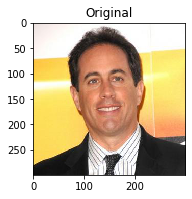

...

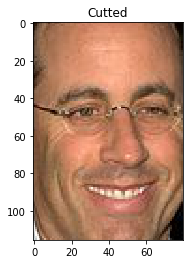

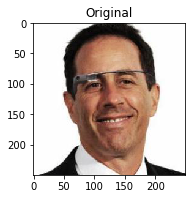

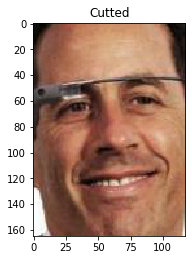

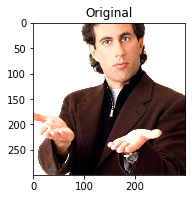

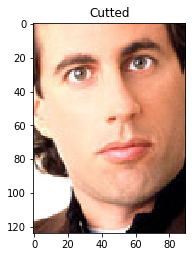

>loaded 21 examples for class: jerry_seinfeld


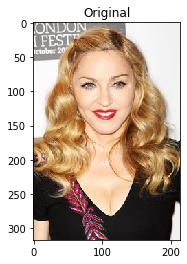

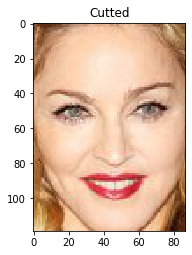

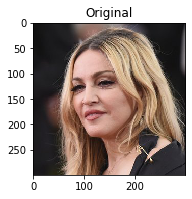

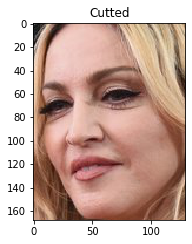

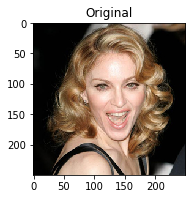

...

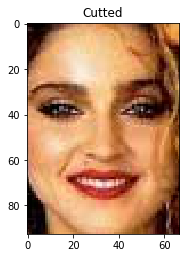

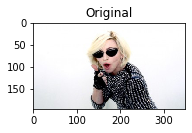

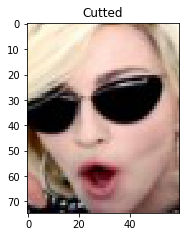

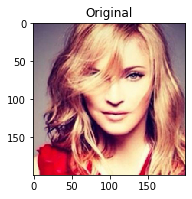

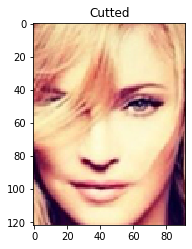

>loaded 19 examples for class: madonna


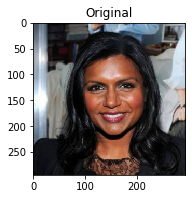

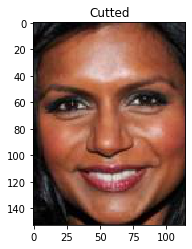

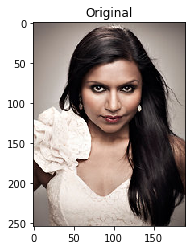

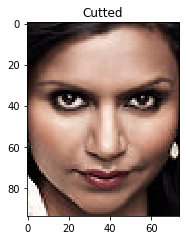

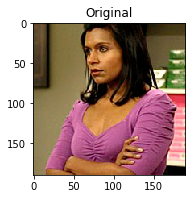

...

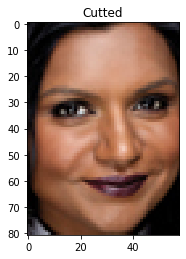

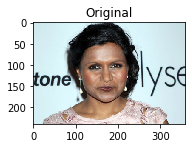

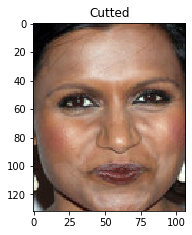

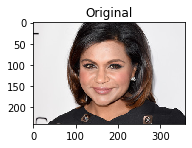

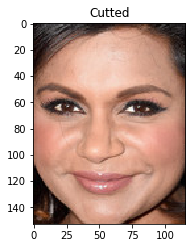

>loaded 22 examples for class: mindy_kaling
(115, 160, 160, 3) (115,)


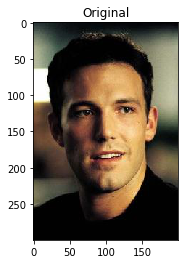

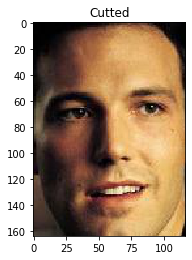

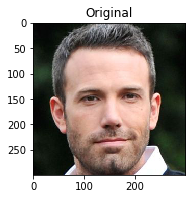

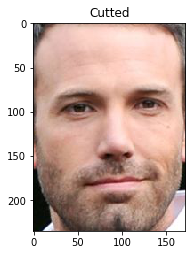

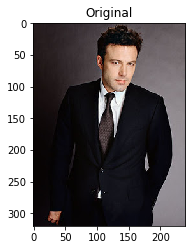

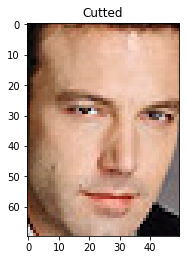

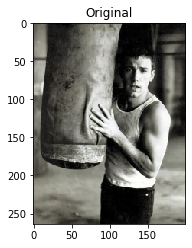

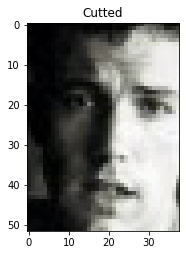

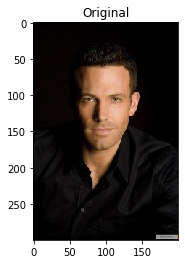

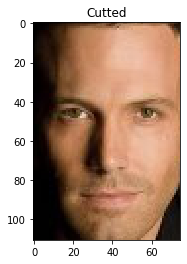

>loaded 5 examples for class: ben_afflek


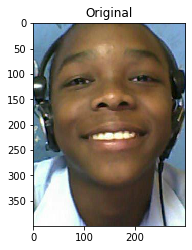

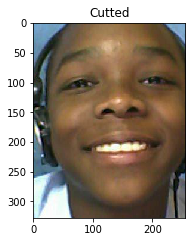

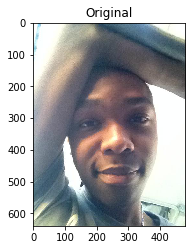

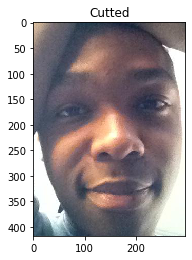

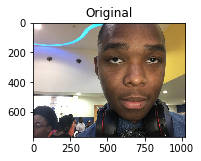

...

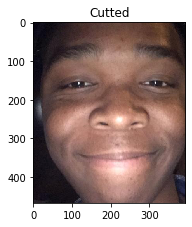

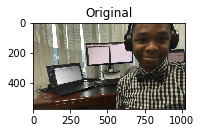

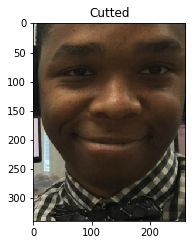

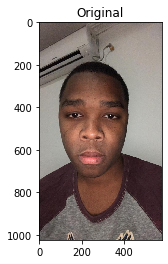

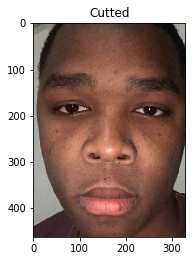

>loaded 6 examples for class: daniel_diaz


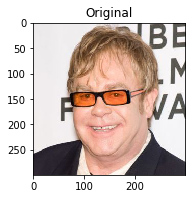

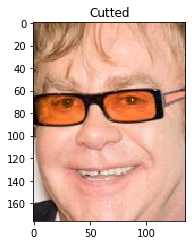

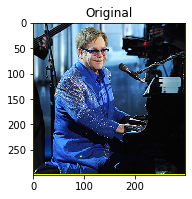

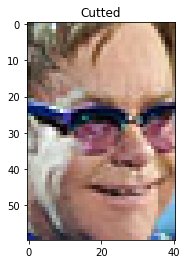

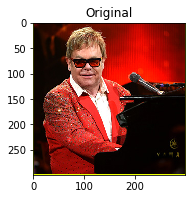

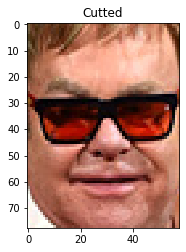

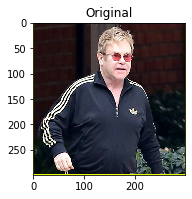

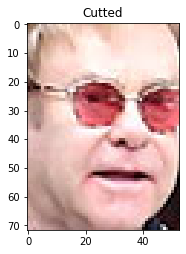

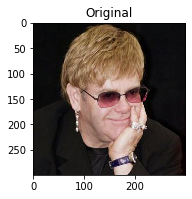

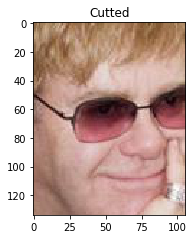

>loaded 5 examples for class: elton_john


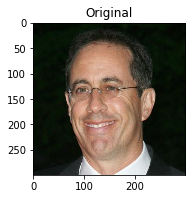

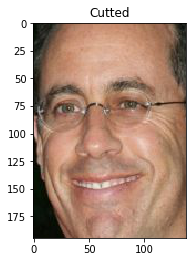

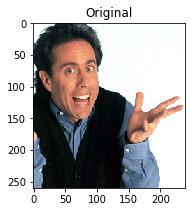

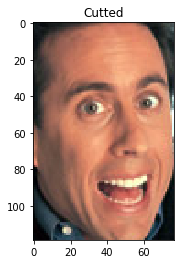

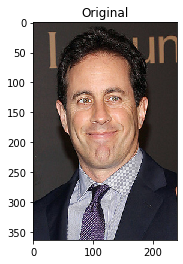

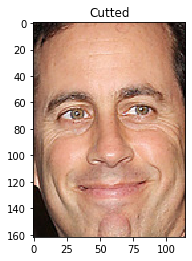

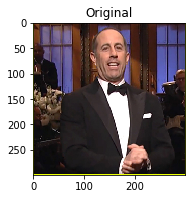

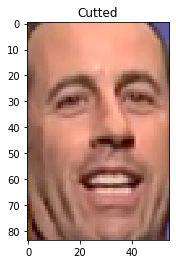

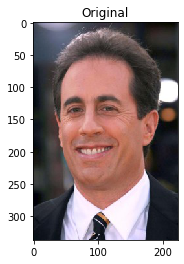

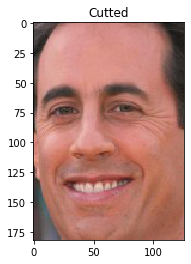

>loaded 5 examples for class: jerry_seinfeld


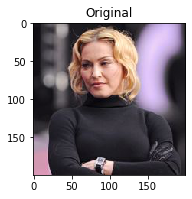

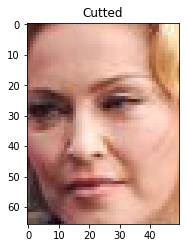

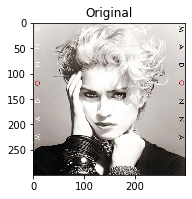

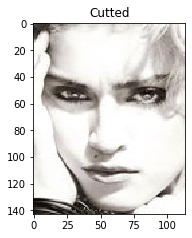

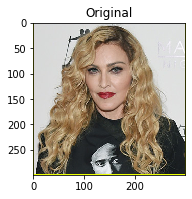

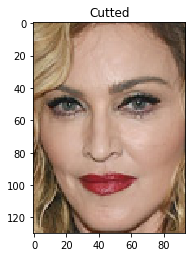

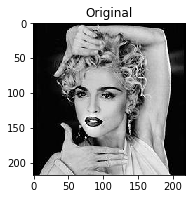

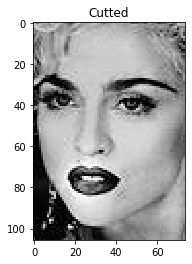

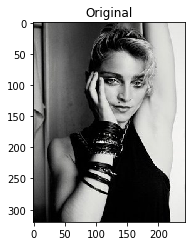

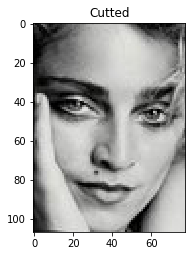

>loaded 5 examples for class: madonna


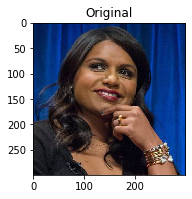

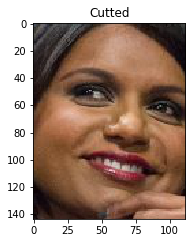

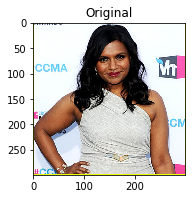

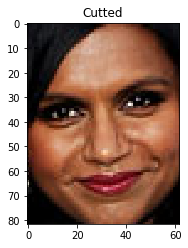

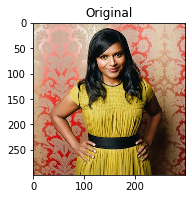

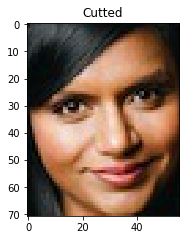

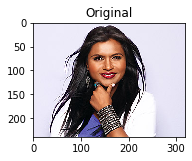

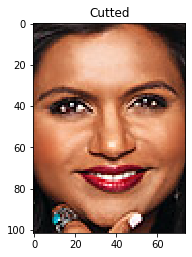

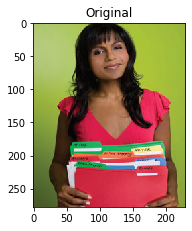

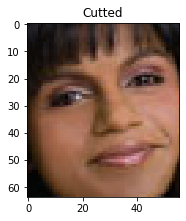

>loaded 5 examples for class: mindy_kaling
(31, 160, 160, 3) (31,)


In [11]:
# load train dataset
trainX, trainy = load_dataset('dataset/train/')
print(trainX.shape, trainy.shape)
# load test dataset
testX, testy = load_dataset('dataset/val/')
print(testX.shape, testy.shape)
# save arrays to one file in compressed format
np.savez_compressed('dataset/5-celebrity-and-me-faces-dataset.npz', trainX, trainy, testX, testy)

## block 2: processing faces

### Load model and data

In [2]:
# load the face dataset
data = np.load('dataset/5-celebrity-and-me-faces-dataset.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print('Loaded: ', trainX.shape, trainy.shape, testX.shape, testy.shape)
# get the face embedding for one face
def get_embedding(model, face_pixels):
    # scale pixel values
    face_pixels = face_pixels.astype('float32')
    # standardize pixel values across channels (global)
    mean, std = face_pixels.mean(), face_pixels.std()
    face_pixels = (face_pixels - mean) / std
    # transform face into one sample
    samples = np.expand_dims(face_pixels, axis=0)
    # make prediction to get embedding
    yhat = model.predict(samples)
    return yhat[0]

# load the model
model = load_model('facenet_keras.h5')
# summarize input and output shape
print(model.inputs)
print(model.outputs)

newTrainX = list()
for face_pixels in trainX:
    embedding = get_embedding(model, face_pixels)
    newTrainX.append(embedding)
newTrainX = np.asarray(newTrainX)
print(newTrainX.shape)
# convert each face in the test set to an embedding
newTestX = list()
for face_pixels in testX:
    embedding = get_embedding(model, face_pixels)
    newTestX.append(embedding)
newTestX = np.asarray(newTestX)
print(newTestX.shape)
# save arrays to one file in compressed format
np.savez_compressed('dataset/5-celebrity-and-me-faces-embeddings.npz', newTrainX, trainy, newTestX, testy)

Loaded:  (115, 160, 160, 3) (115,) (31, 160, 160, 3) (31,)
[<tf.Tensor 'input_1:0' shape=(None, 160, 160, 3) dtype=float32>]
[<tf.Tensor 'Bottleneck_BatchNorm/batchnorm/add_1:0' shape=(None, 128) dtype=float32>]
(115, 128)
(31, 128)


## block 3: fit model and predict

In [2]:
# load dataset
data = np.load('dataset/5-celebrity-and-me-faces-embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
print(f'Dataset: train={trainX.shape[0]}, test={testX.shape[0]}')
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)
# fit model
model = SVC(kernel='linear', probability=True)
model.fit(trainX, trainy)
# predict
yhat_train = model.predict(trainX)
yhat_test = model.predict(testX)
# score
score_train = accuracy_score(trainy, yhat_train)
score_test = accuracy_score(testy, yhat_test)
# summarize
print(f'Accuracy: train={score_train*100:.2f}%, test={score_test*100:.2f}%')

Dataset: train=115, test=31
Accuracy: train=100.00%, test=100.00%


In [3]:
# load faces
data = np.load('dataset/5-celebrity-and-me-faces-dataset.npz')
testX_faces = data['arr_2']
# load face embeddings
data = np.load('dataset/5-celebrity-and-me-faces-embeddings.npz')
trainX, trainy, testX, testy = data['arr_0'], data['arr_1'], data['arr_2'], data['arr_3']
# normalize input vectors
in_encoder = Normalizer(norm='l2')
trainX = in_encoder.transform(trainX)
testX = in_encoder.transform(testX)
# label encode targets
out_encoder = LabelEncoder()
out_encoder.fit(trainy)
trainy = out_encoder.transform(trainy)
testy = out_encoder.transform(testy)
# fit model
model = SVC(kernel='linear', probability=True)
model.fit(trainX, trainy)

SVC(kernel='linear', probability=True)

Predicted: daniel_diaz (84.237)
Expected: daniel_diaz


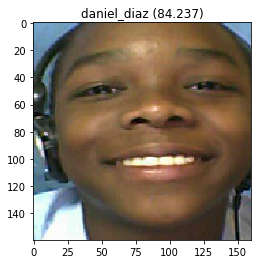

In [19]:
# test model on a random example from the test dataset
selection = choice([i for i in range(testX.shape[0])])
random_face_pixels = testX_faces[selection]
random_face_emb = testX[selection]
random_face_class = testy[selection]
random_face_name = out_encoder.inverse_transform([random_face_class])
# prediction for the face
samples = np.expand_dims(random_face_emb, axis=0)
yhat_class = model.predict(samples)
yhat_prob = model.predict_proba(samples)
# get name
class_index = yhat_class[0]
class_probability = yhat_prob[0,class_index] * 100
predict_names = out_encoder.inverse_transform(yhat_class)
print('Predicted: %s (%.3f)' % (predict_names[0], class_probability))
print('Expected: %s' % random_face_name[0])
# plot for fun
plt.imshow(random_face_pixels)
title = '%s (%.3f)' % (predict_names[0], class_probability)
plt.title(title)
plt.show()